In [1]:
# Check GPU type
!nvidia-smi

'nvidia-smi' is not recognized as an internal or external command,
operable program or batch file.


In [ ]:
# mount drive
#from google.colab import drive
#drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
# Import libraries
import pandas as pd 
import os
from pathlib import Path
import shutil
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tqdm.notebook import tqdm
import cv2
import yaml
import matplotlib.pyplot as plt
from ultralytics import YOLO
import multiprocessing
import numpy as np
from PIL import Image

In [3]:
# INPUT_DIRS
INPUT_DATA_DIR = Path('C:/Users/Reinhard/Documents/computer_vision_projects/amini_cocoa_contamination_challenge')

In [5]:
os.listdir((INPUT_DATA_DIR))

['Cocoa_Disease_Starter_Notebook.ipynb',
 'dataset',
 'SampleSubmission.csv',
 'Test.csv',
 'Train.csv',
 'yolov8n.pt']

In [6]:
## Drop the Folder if it already exists
DATASETS_DIR = Path('dataset')
DATASETS_DIR

WindowsPath('dataset')

In [8]:
# Image & labels directory
TRAIN_IMAGES_DIR = DATASETS_DIR / 'images' / 'train'
TRAIN_LABELS_DIR = DATASETS_DIR / 'labels'/ 'train'
TEST_IMAGES_DIR = DATASETS_DIR / 'images' / 'test'
VAL_IMAGES_DIR = DATASETS_DIR / 'images' /'val'
VAL_LABELS_DIR = DATASETS_DIR / 'labels' /'val'

In [9]:
# Check if DATASETS_DIR exists, if it does delete it and recreate it
for DIR in [TRAIN_IMAGES_DIR, VAL_IMAGES_DIR, TEST_IMAGES_DIR, VAL_LABELS_DIR, DATASETS_DIR]:
  if DIR.exists():
    shutil.rmtree(DIR)
  DIR.mkdir(parents=True, exist_ok = True)

In [10]:
# Unpack the 'dataset.zip'
shutil.unpack_archive(INPUT_DATA_DIR / 'dataset.zip', DATASETS_DIR)

ReadError: C:\Users\Reinhard\Documents\computer_vision_projects\amini_cocoa_contamination_challenge\dataset.zip is not a zip file

In [9]:
def count_files(directory):
    total_files = 0
    for root, _, files in os.walk(directory):
        total_files += len(files)
    return total_files

In [ ]:
## Count the number files in TRAIN_IMAGES_DIR
num_train_images = count_files(TRAIN_IMAGES_DIR)
print(f"There are {num_train_images} in {TRAIN_IMAGES_DIR}")

There are 5529 in dataset/images/train


In [10]:
## Count the number of files in TRAIN_LABELS_DIR
num_train_labels = count_files(TRAIN_LABELS_DIR)
print(f"There are {num_train_labels} in {TRAIN_LABELS_DIR}")

There are 5529 in dataset\labels\train


In [11]:
## Get the set of all the stems of the images in TRAIN_IMAGES_DIR
train_images_stems = set([str(Path(name).stem) for name in os.listdir(TRAIN_IMAGES_DIR)])
len(train_images_stems)

5529

In [12]:
## Get the set of all the stems of the labes in TRAIN_LABELS_DIR
train_labels_stems = set([str(Path(name).stem) for name in os.listdir(TRAIN_LABELS_DIR)])
len(train_labels_stems)

5529

In [13]:
# Check that the two sets are identitical
train_images_stems == train_labels_stems

True

In [14]:
TRAIN_IMAGES_DIR.absolute()

WindowsPath('c:/Users/Reinhard/Documents/computer_vision_projects/amini_cocoa_contamination_challenge/dataset/images/train')

In [15]:
# Load train and test files
train = pd.read_csv(INPUT_DATA_DIR / 'Train.csv')
test = pd.read_csv(INPUT_DATA_DIR / 'Test.csv')
ss = pd.read_csv(INPUT_DATA_DIR / 'SampleSubmission.csv')

In [18]:
## Sample submission file
ss.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax
0,ID_Genxyu.jpg,healthy,0.5,100,100,100,100
1,ID_svY6TG.jpg,healthy,0.5,100,100,100,100
2,ID_d0gpda.jpg,healthy,0.5,100,100,100,100
3,ID_frWmBT.jpg,healthy,0.5,100,100,100,100
4,ID_TaRW6o.jpg,healthy,0.5,100,100,100,100


In [23]:
train.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax,class_id,ImagePath
0,ID_nBgcAR.jpg,healthy,1.0,75.0,15.0,162.0,195.0,2,dataset/images/train/ID_nBgcAR.jpg
1,ID_nBgcAR.jpg,healthy,1.0,58.0,1.0,133.0,171.0,2,dataset/images/train/ID_nBgcAR.jpg
2,ID_nBgcAR.jpg,healthy,1.0,42.0,29.0,377.0,349.0,2,dataset/images/train/ID_nBgcAR.jpg
3,ID_Kw2v8A.jpg,healthy,1.0,112.0,124.0,404.0,341.0,2,dataset/images/train/ID_Kw2v8A.jpg
4,ID_Kw2v8A.jpg,healthy,1.0,148.0,259.0,413.0,412.0,2,dataset/images/train/ID_Kw2v8A.jpg


In [24]:
train['class'].unique()

array(['healthy', 'anthracnose', 'cssvd'], dtype=object)

In [25]:
train['class_id'].unique()

array([2, 0, 1], dtype=int64)

In [31]:
train[['class', 'class_id']].value_counts()

class        class_id
healthy      2           4279
cssvd        1           3223
anthracnose  0           2271
cssvd        0             18
healthy      1              1
Name: count, dtype: int64

In [32]:
class_map = {cls: i for i, cls in enumerate(sorted(train['class'].unique().tolist()))}
class_map

{'anthracnose': 0, 'cssvd': 1, 'healthy': 2}

In [33]:
# Strip any spacing from the class item and make sure that it is a str
train['class'] = train['class'].str.strip()

# Map {'healthy': 2, 'cssvd': 1, anthracnose: 0}
train['class_id'] = train['class'].map(class_map)

In [ ]:
train[['class', 'class_id']].value_counts()

,,count
class,class_id,
healthy,2,4280
cssvd,1,3241
anthracnose,0,2271


In [34]:
# Number of unique images path
train['ImagePath'].nunique()

5529

In [37]:
# Split the train dataset into train_df & val_df
train_names, val_names = train_test_split(train['Image_ID'].unique(), test_size=0.15, random_state=42)

train_df = train[train['Image_ID'].isin(train_names)]
val_df = train[train['Image_ID'].isin(val_names)]

In [38]:
train_df.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax,class_id,ImagePath
0,ID_nBgcAR.jpg,healthy,1.0,75.0,15.0,162.0,195.0,2,dataset/images/train/ID_nBgcAR.jpg
1,ID_nBgcAR.jpg,healthy,1.0,58.0,1.0,133.0,171.0,2,dataset/images/train/ID_nBgcAR.jpg
2,ID_nBgcAR.jpg,healthy,1.0,42.0,29.0,377.0,349.0,2,dataset/images/train/ID_nBgcAR.jpg
3,ID_Kw2v8A.jpg,healthy,1.0,112.0,124.0,404.0,341.0,2,dataset/images/train/ID_Kw2v8A.jpg
4,ID_Kw2v8A.jpg,healthy,1.0,148.0,259.0,413.0,412.0,2,dataset/images/train/ID_Kw2v8A.jpg


In [39]:
train_df.shape, val_df.shape, test.shape

((8236, 9), (1556, 9), (1626, 9))

In [40]:
ss.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax
0,ID_Genxyu.jpg,healthy,0.5,100,100,100,100
1,ID_svY6TG.jpg,healthy,0.5,100,100,100,100
2,ID_d0gpda.jpg,healthy,0.5,100,100,100,100
3,ID_frWmBT.jpg,healthy,0.5,100,100,100,100
4,ID_TaRW6o.jpg,healthy,0.5,100,100,100,100


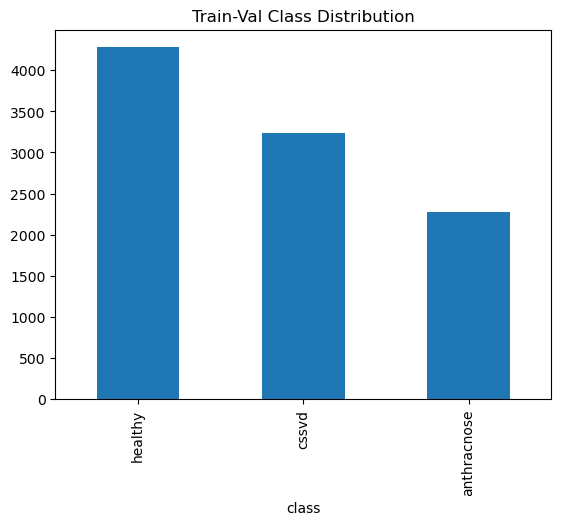

In [41]:
# Preview target distribution, seems there a class imbalance that needs to be handled
train['class'].value_counts().plot(kind='bar')
plt.title('Train-Val Class Distribution')
plt.show();

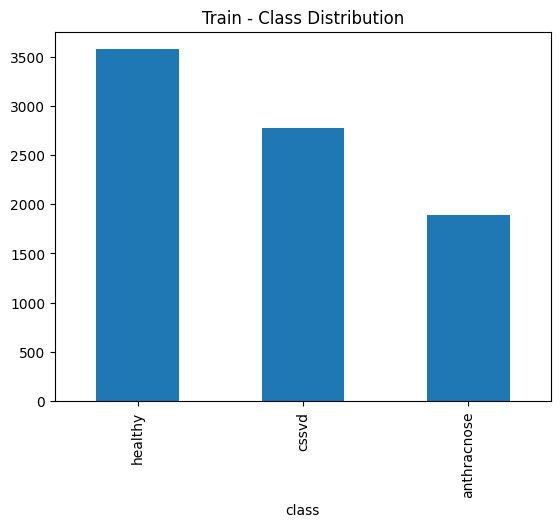

In [ ]:
train_df['class'].value_counts().plot(kind='bar')
plt.title('Train - Class Distribution')
plt.show();

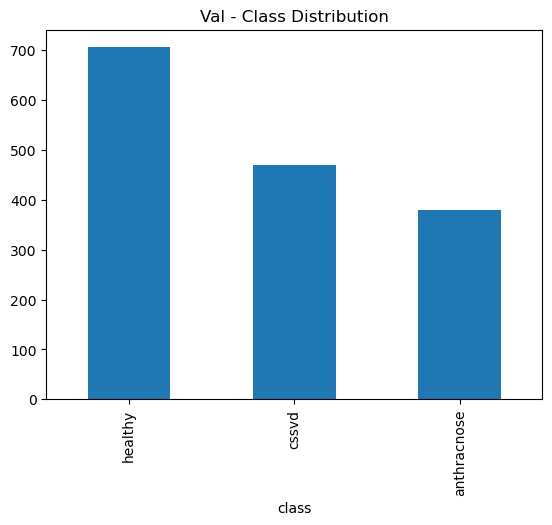

In [42]:
val_df['class'].value_counts().plot(kind='bar')
plt.title('Val - Class Distribution')
plt.show();

In [45]:
# Create a data.yaml file required by yolo
class_names = sorted(train['class'].unique().tolist())
num_classes = len(class_names)

data_yaml = {
    "path" : str(DATASETS_DIR.absolute()),
    'train': str(TRAIN_IMAGES_DIR.absolute()),
    'val': str(VAL_IMAGES_DIR.absolute()),
    'test': str(TEST_IMAGES_DIR.absolute()),
    'nc': num_classes,
    'names': class_names
}

yaml_path = 'data.yaml'
with open(yaml_path, 'w') as file:
    yaml.dump(data_yaml, file, default_flow_style=False)

# Preview data yaml file
data_yaml

{'path': 'c:\\Users\\Reinhard\\Documents\\computer_vision_projects\\amini_cocoa_contamination_challenge\\dataset',
 'train': 'c:\\Users\\Reinhard\\Documents\\computer_vision_projects\\amini_cocoa_contamination_challenge\\dataset\\images\\train',
 'val': 'c:\\Users\\Reinhard\\Documents\\computer_vision_projects\\amini_cocoa_contamination_challenge\\dataset\\images\\val',
 'test': 'c:\\Users\\Reinhard\\Documents\\computer_vision_projects\\amini_cocoa_contamination_challenge\\dataset\\images\\test',
 'nc': 3,
 'names': ['anthracnose', 'cssvd', 'healthy']}

In [46]:
len(val_names), len(set(val_names))

(830, 830)

In [47]:
val_image_names = [str(Path(name).stem) for name in val_df['Image_ID'].unique()]

In [48]:
len(val_image_names)

830

In [49]:
# list of images in TRAIN_IMAGES_DIR
images_in_train_dir = os.listdir(TRAIN_IMAGES_DIR)
len(images_in_train_dir), len(train_names)

(5529, 4699)

In [50]:
train_image_names = [str(Path(name).stem) for name in train['ImagePath'].unique()]

In [53]:
len(train_image_names)

5529

In [55]:
# Check that VAL_IMAGES_DIR & VAL_LABELS_DIR exist if not create them
for DIR in [VAL_IMAGES_DIR, VAL_LABELS_DIR]:
  if not DIR.exists():
    DIR.mkdir(parents=True, exist_ok = True)

In [56]:
# Copy images in val_names to dataset/val and do the same with the labels
for image_name in tqdm(val_names):
    shutil.move(TRAIN_IMAGES_DIR / image_name, VAL_IMAGES_DIR / image_name)
    img_ext = image_name.split('.')[-1]
    label_name = image_name.replace(f'.{img_ext}', '.txt')
    shutil.move(TRAIN_LABELS_DIR / label_name, VAL_LABELS_DIR / label_name)

  0%|          | 0/830 [00:00<?, ?it/s]

Plotting ID_a0M4cn.jpg with 2 bounding boxes.


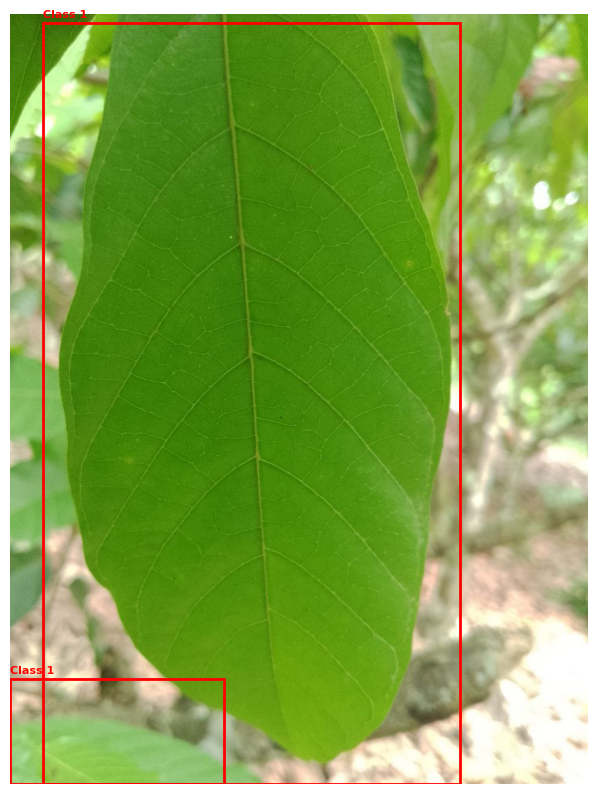

Plotting ID_A1OsZt.jpeg with 1 bounding boxes.


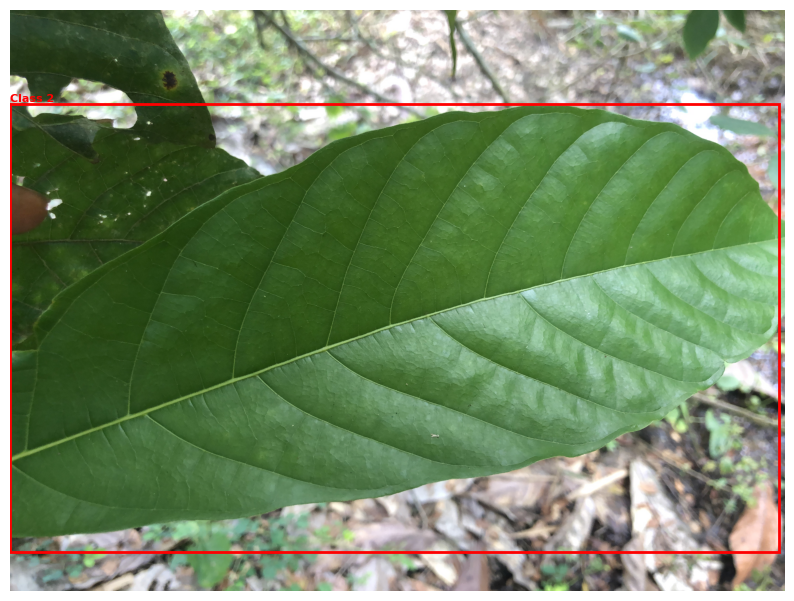

Plotting ID_a2zxFb.jpg with 1 bounding boxes.


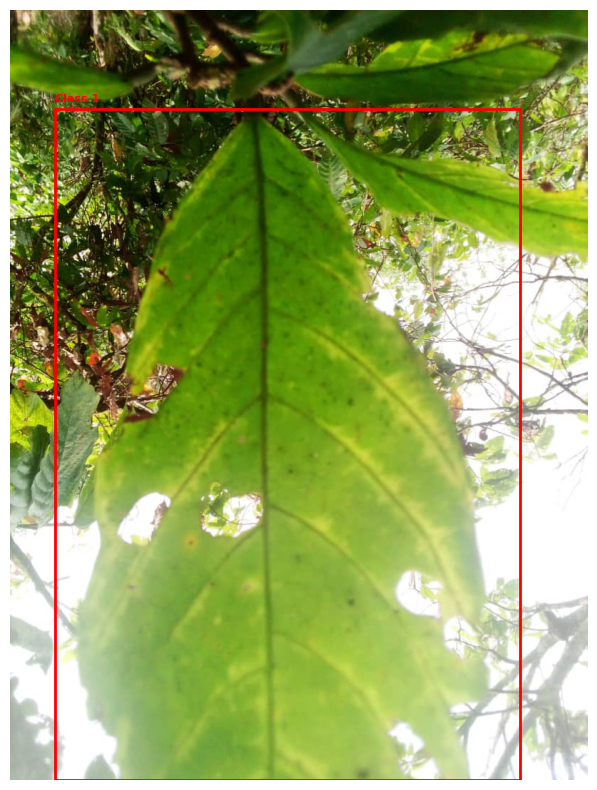

Plotting ID_a34fvU.jpg with 6 bounding boxes.


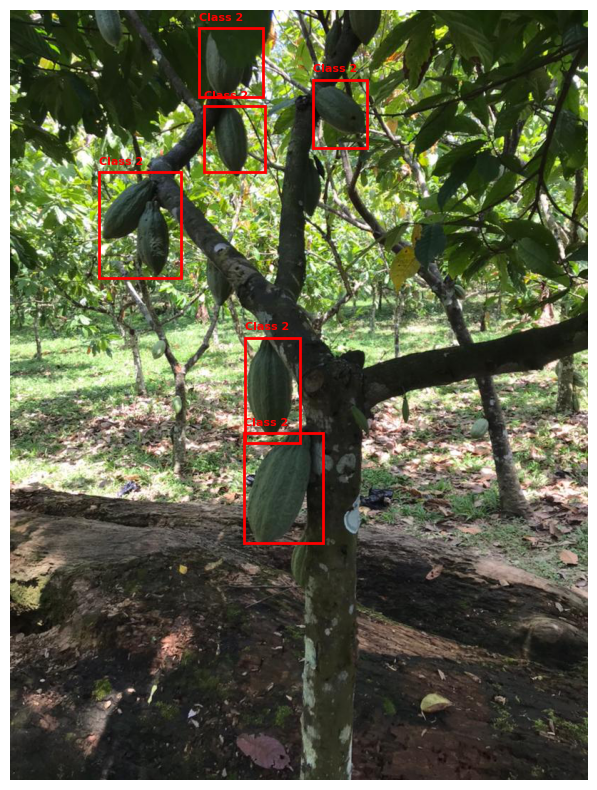

Plotting ID_A397lM.jpg with 1 bounding boxes.


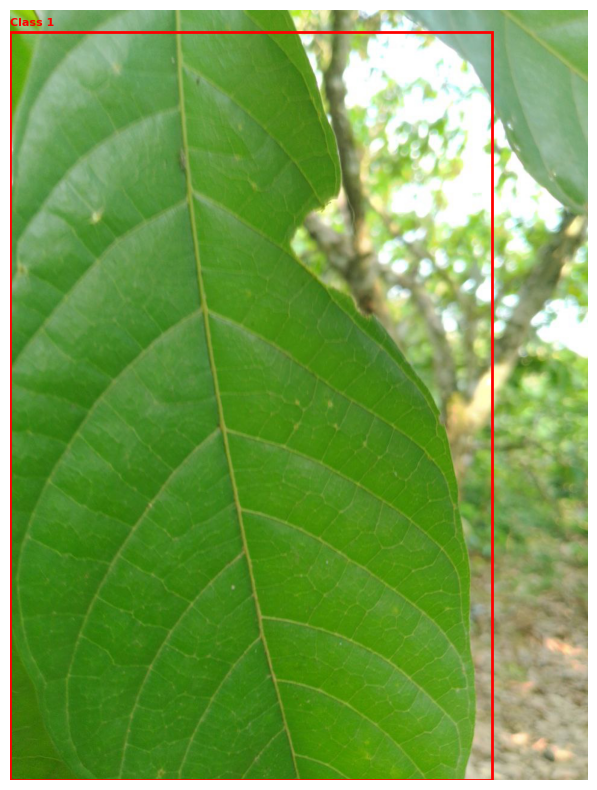

In [57]:
# Plot some images and their bboxes to ensure the conversion was done correctly
def load_annotations(label_path):
    with open(label_path, 'r') as f:
        lines = f.readlines()
    boxes = []
    for line in lines:
        class_id, x_center, y_center, width, height = map(float, line.strip().split())
        boxes.append((class_id, x_center, y_center, width, height))
    return boxes

# Function to plot an image with its bounding boxes
def plot_image_with_boxes(image_path, boxes):
    # Load the image
    image = np.array(Image.open(str(image_path)))


    # Get image dimensions
    h, w, _ = image.shape

    # Plot the image
    plt.figure(figsize=(10, 10))
    plt.imshow(image)

    # Plot each bounding box
    for box in boxes:
        class_id, x_center, y_center, width, height = box
        # Convert YOLO format to corner coordinates
        xmin = int((x_center - width / 2) * w)
        ymin = int((y_center - height / 2) * h)
        xmax = int((x_center + width / 2) * w)
        ymax = int((y_center + height / 2) * h)

        # Draw the bounding box
        plt.gca().add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                          edgecolor='red', facecolor='none', linewidth=2))
        plt.text(xmin, ymin - 10, f'Class {int(class_id)}', color='red', fontsize=8, weight='bold')

    plt.axis('off')
    plt.show()

# Directories for images and labels
IMAGE_DIR = TRAIN_IMAGES_DIR
LABEL_DIR = TRAIN_LABELS_DIR

# Plot a few images with their annotations
for image_name in os.listdir(IMAGE_DIR)[:5]:
    image_path = IMAGE_DIR / image_name
    img_ext = image_name.split('.')[-1]
    label_path = LABEL_DIR / (image_name.replace(f'.{img_ext}', '.txt'))

    if label_path.exists():
        boxes = load_annotations(label_path)
        print(f"Plotting {image_name} with {len(boxes)} bounding boxes.")
        plot_image_with_boxes(image_path, boxes)
    else:
        print(f"No annotations found for {image_name}.")


In [60]:
# Load a yolo pretrained model
model = YOLO('yolov8n.pt')

# Fine tune model to our data
model.train(
    data='data.yaml',          # Path to the dataset configuration
    epochs=10,                 # Number of epochs
    imgsz=1024,                # Image size (height, width)
    batch=8,                   # Batch size
    device='cpu',              # Device to use ('cpu' since CUDA is not available)
    patience=5)

Ultralytics 8.3.16  Python-3.12.4 torch-2.5.0+cpu CPU (Intel Core(TM) i5-6300U 2.40GHz)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=data.yaml, epochs=10, time=None, patience=5, batch=8, imgsz=1024, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_wi

100%|██████████| 755k/755k [00:01<00:00, 492kB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning C:\Users\Reinhard\Documents\computer_vision_projects\amini_cocoa_contamination_challenge\dataset\labels\train... 4699 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4699/4699 [03:55<00:00, 19.95it/s]

train: WARNING  C:\Users\Reinhard\Documents\computer_vision_projects\amini_cocoa_contamination_challenge\dataset\images\train\ID_AJD939.jpg: corrupt JPEG restored and saved
train: WARNING  C:\Users\Reinhard\Documents\computer_vision_projects\amini_cocoa_contamination_challenge\dataset\images\train\ID_AMshRT.jpeg: corrupt JPEG restored and saved
train: WARNING  C:\Users\Reinhard\Documents\computer_vision_projects\amini_cocoa_contamination_challenge\dataset\images\train\ID_AOGygM.jpeg: corrupt JPEG restored and saved
train: WARNING  C:\Users\Reinhard\Documents\computer_vision_projects\amini_cocoa_contamination_challenge\dataset\images\train\ID_AbHMqL.jpg: corrupt JPEG restored and saved
train: WARNING  C:\Users\Reinhard\Documents\computer_vision_projects\amini_cocoa_contamination_challenge\dataset\images\train\ID_AhmyiY.jpeg: corrupt JPEG restored and saved
train: WARNING  C:\Users\Reinhard\Documents\computer_vision_projects\amini_cocoa_contamination_challenge\dataset\images\train\ID_Ahw

train: New cache created: C:\Users\Reinhard\Documents\computer_vision_projects\amini_cocoa_contamination_challenge\dataset\labels\train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


c:\Users\Reinhard\anaconda3\envs\Datascience\Lib\site-packages\albumentations\check_version.py:107: UserWarning: Error fetching version info <urlopen error [Errno 11001] getaddrinfo failed>
  data = fetch_version_info()
c:\Users\Reinhard\anaconda3\envs\Datascience\Lib\site-packages\ultralytics\data\augment.py:1850: UserWarning: Argument(s) 'quality_lower' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=75, p=0.0),
val: Scanning C:\Users\Reinhard\Documents\computer_vision_projects\amini_cocoa_contamination_challenge\dataset\labels\val... 830 images, 0 backgrounds, 0 corrupt: 100%|██████████| 830/830 [00:36<00:00, 22.72it/s]

val: WARNING  C:\Users\Reinhard\Documents\computer_vision_projects\amini_cocoa_contamination_challenge\dataset\images\val\ID_AYKor4.jpg: corrupt JPEG restored and saved
val: WARNING  C:\Users\Reinhard\Documents\computer_vision_projects\amini_cocoa_contamination_challenge\dataset\images\val\ID_DEVBif.jpg: corrupt JPEG restored and saved
val: WARNING  C:\Users\Reinhard\Documents\computer_vision_projects\amini_cocoa_contamination_challenge\dataset\images\val\ID_Dcoa03.jpg: corrupt JPEG restored and saved
val: WARNING  C:\Users\Reinhard\Documents\computer_vision_projects\amini_cocoa_contamination_challenge\dataset\images\val\ID_ESQAmP.jpeg: corrupt JPEG restored and saved
val: WARNING  C:\Users\Reinhard\Documents\computer_vision_projects\amini_cocoa_contamination_challenge\dataset\images\val\ID_FtYRqz.jpeg: corrupt JPEG restored and saved
val: WARNING  C:\Users\Reinhard\Documents\computer_vision_projects\amini_cocoa_contamination_challenge\dataset\images\val\ID_GWhiLp.jpeg: corrupt JPEG re

val: New cache created: C:\Users\Reinhard\Documents\computer_vision_projects\amini_cocoa_contamination_challenge\dataset\labels\val.cache
Plotting labels to runs\detect\train\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.0005), 69 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 1024 train, 1024 val
Using 0 dataloader workers
Logging results to runs\detect\train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


c:\Users\Reinhard\anaconda3\envs\Datascience\Lib\site-packages\ultralytics\data\augment.py:1850: UserWarning: Argument(s) 'quality_lower' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=75, p=0.0),
       1/10         0G      1.737      3.957      2.354          5       1024: 100%|██████████| 588/588 [3:34:50<00:00, 21.92s/it]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [08:58<00:00, 10.36s/it]


                   all        830       1556       0.46      0.378       0.35      0.145

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10         0G      1.635      2.376      2.231         10       1024: 100%|██████████| 588/588 [5:19:19<00:00, 32.58s/it]    
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [15:42<00:00, 18.12s/it]


                   all        830       1556      0.408      0.461       0.39      0.195

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10         0G      1.595      2.091      2.182         12       1024:  36%|███▌      | 212/588 [24:40:26<43:45:41, 418.99s/it]    


KeyboardInterrupt: 

In [ ]:
# Validate the model on the validation set
model = YOLO('/content/runs/detect/train/weights/best.pt')
results = model.val()

Ultralytics 8.3.84 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/dataset/labels/val.cache... 830 images, 0 backgrounds, 0 corrupt: 100%|██████████| 830/830 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/dataset/images/val/ID_AYKor4.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_DEVBif.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_Dcoa03.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_ESQAmP.jpeg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_FtYRqz.jpeg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_GWhiLp.jpeg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_H9qAYr.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_Hmxdwo.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_HuMwmi.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_J7hL2Y.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/dataset/images/val/ID_JHsmyN.jpeg: corrupt JPEG restored and s


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [00:10<00:00,  4.88it/s]


                   all        830       1556      0.719      0.588      0.661      0.415
           anthracnose        252        385      0.767       0.54      0.639      0.385
                 cssvd        306        465      0.681      0.616      0.657      0.423
               healthy        272        706      0.707      0.608      0.687      0.436
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/val


In [65]:
# Load the trained YOLO model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Path to the test images directory
test_dir_path = TEST_IMAGES_DIR

# Get a list of all image files in the test directory
image_files = os.listdir(test_dir_path)

# Initialize an empty list to store the results for all images
all_data = []

# Initialize an empty list to store the results for all images
all_data = []

# Iterate through each image in the directory
for image_file in tqdm(image_files):
    # Full path to the image
    img_path = os.path.join(test_dir_path, image_file)

    # Make predictions on the image
    results = model(img_path)

    # Extract bounding boxes, confidence scores, and class labels
    boxes = results[0].boxes.xyxy.tolist() if results[0].boxes else []  # Bounding boxes in xyxy format
    classes = results[0].boxes.cls.tolist() if results[0].boxes else []  # Class indices
    confidences = results[0].boxes.conf.tolist() if results[0].boxes else []  # Confidence scores
    names = results[0].names  # Class names dictionary

    if boxes:  # If detections are found
        for box, cls, conf in zip(boxes, classes, confidences):
            x1, y1, x2, y2 = box
            detected_class = names[int(cls)]  # Get the class name from the names dictionary

            # Add the result to the all_data list
            all_data.append({
                'Image_ID': str(image_file),
                'class': detected_class,
                'confidence': conf,
                'ymin': y1,
                'xmin': x1,
                'ymax': y2,
                'xmax': x2
            })
    else:  # If no objects are detected
        all_data.append({
            'Image_ID': str(image_file),
            'class': "None",
            'confidence': None,
            'ymin': None,
            'xmin': None,
            'ymax': None,
            'xmax': None
        })



  0%|          | 0/1626 [00:00<?, ?it/s]


image 1/1 /content/dataset/images/test/ID_n9p1ZH.jpeg: 768x1024 1 anthracnose, 1 healthy, 9.4ms
Speed: 8.8ms preprocess, 9.4ms inference, 1.7ms postprocess per image at shape (1, 3, 768, 1024)

image 1/1 /content/dataset/images/test/ID_tDjhPh.jpg: 1024x768 1 cssvd, 8.8ms
Speed: 6.9ms preprocess, 8.8ms inference, 1.4ms postprocess per image at shape (1, 3, 1024, 768)

image 1/1 /content/dataset/images/test/ID_O3r16M.jpg: 768x1024 3 healthys, 9.1ms
Speed: 9.3ms preprocess, 9.1ms inference, 1.4ms postprocess per image at shape (1, 3, 768, 1024)

image 1/1 /content/dataset/images/test/ID_i5VHxx.jpg: 1024x768 2 anthracnoses, 9.6ms
Speed: 7.1ms preprocess, 9.6ms inference, 1.9ms postprocess per image at shape (1, 3, 1024, 768)

image 1/1 /content/dataset/images/test/ID_F7a5DB.jpg: 768x1024 1 cssvd, 9.1ms
Speed: 5.5ms preprocess, 9.1ms inference, 1.3ms postprocess per image at shape (1, 3, 768, 1024)

image 1/1 /content/dataset/images/test/ID_dPWfDI.JPG: 1024x768 3 healthys, 9.1ms
Speed: 7.1

In [66]:
# Convert the list to a DataFrame for all images
sub = pd.DataFrame(all_data)

In [67]:
sub.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax
0,ID_n9p1ZH.jpeg,anthracnose,0.509511,0.000000,1003.207886,3007.730957,2860.460938
1,ID_n9p1ZH.jpeg,healthy,0.312592,1428.554443,2756.289795,2304.696777,4004.034912
2,ID_tDjhPh.jpg,cssvd,0.904617,21.308746,171.976547,1218.401367,960.000000
3,ID_O3r16M.jpg,healthy,0.695902,121.038582,17.408247,1884.322266,2126.318359
4,ID_O3r16M.jpg,healthy,0.665808,464.426697,865.973633,3017.496826,2535.067871


In [68]:
sub['class'].value_counts()

,count
class,
healthy,1042
cssvd,887
anthracnose,471
None,35


In [70]:
# Create submission file to be uploaded to Zindi for scoring
sub.to_csv(f'{INPUT_DATA_DIR / "BenchmarkSubmission.csv"}', index = False)

In [71]:
train['Image_ID'].nunique(), test['Image_ID'].nunique()

(5529, 1626)

In [72]:
train_df['Image_ID'].nunique() + val_df['Image_ID'].nunique() + test['Image_ID'].nunique()

7155

In [73]:
sub = pd.read_csv(f'{INPUT_DATA_DIR / "BenchmarkSubmission.csv"}')
sub.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax
0,ID_n9p1ZH.jpeg,anthracnose,0.509511,0.000000,1003.207886,3007.730957,2860.460938
1,ID_n9p1ZH.jpeg,healthy,0.312592,1428.554443,2756.289795,2304.696777,4004.034912
2,ID_tDjhPh.jpg,cssvd,0.904617,21.308746,171.976547,1218.401367,960.000000
3,ID_O3r16M.jpg,healthy,0.695902,121.038582,17.408247,1884.322266,2126.318359
4,ID_O3r16M.jpg,healthy,0.665808,464.426697,865.973633,3017.496826,2535.067871


In [74]:
## Make a dataframe from all entries in sub with no detection
no_detection = sub[~sub['class'].isin(['cssvd', 'healthy', 'anthracnose'])]
no_detection

,Image_ID,class,confidence,ymin,xmin,ymax,xmax
37,ID_ItYYic.jpeg,NaN,NaN,NaN,NaN,NaN,NaN
117,ID_QcU601.jpg,NaN,NaN,NaN,NaN,NaN,NaN
176,ID_FbsP3U.JPG,NaN,NaN,NaN,NaN,NaN,NaN
293,ID_R6trN8.jpeg,NaN,NaN,NaN,NaN,NaN,NaN
378,ID_TnGU2G.jpg,NaN,NaN,NaN,NaN,NaN,NaN
503,ID_xGu1Jv.JPG,NaN,NaN,NaN,NaN,NaN,NaN
575,ID_pnZVaB.jpg,NaN,NaN,NaN,NaN,NaN,NaN
590,ID_jHqWXa.jpg,NaN,NaN,NaN,NaN,NaN,NaN
615,ID_wLF5dT.jpg,NaN,NaN,NaN,NaN,NaN,NaN
709,ID_jLH9Ls.jpg,NaN,NaN,NaN,NaN,NaN,NaN


In [75]:
# Get a random image from no_detection
rnd_no_detect_image = no_detection.sample(1)['Image_ID'].values[0]
rnd_no_detect_image

'ID_V4uHkL.jpeg'

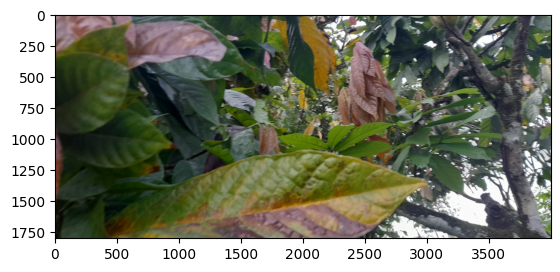

In [76]:
# Plot the rnd_no_detect_image
image_path = TEST_IMAGES_DIR / rnd_no_detect_image
image = np.array(Image.open(str(image_path)))
plt.imshow(image);

In [77]:
no_detection['Image_ID'].unique()

array(['ID_ItYYic.jpeg', 'ID_QcU601.jpg', 'ID_FbsP3U.JPG', 'ID_R6trN8.jpeg', 'ID_TnGU2G.jpg', 'ID_xGu1Jv.JPG', 'ID_pnZVaB.jpg', 'ID_jHqWXa.jpg', 'ID_wLF5dT.jpg', 'ID_jLH9Ls.jpg', 'ID_XzSqhK.JPG', 'ID_anegvH.jpeg', 'ID_Gc703Q.jpg', 'ID_OgEb5I.jpg', 'ID_GM6Ads.JPG', 'ID_hcfuoO.JPG', 'ID_mHoDGw.JPG', 'ID_GSj4su.jpeg',
       'ID_Zz62xP.jpg', 'ID_Suoisd.JPG', 'ID_CWDQS2.jpeg', 'ID_ksM9yC.JPG', 'ID_rcw57Y.JPG', 'ID_gxJl1S.jpg', 'ID_G0OzBp.jpg', 'ID_PH0j4i.jpg', 'ID_JfmHHi.jpeg', 'ID_XvjhVZ.JPG', 'ID_V6RfQo.jpg', 'ID_V4uHkL.jpeg', 'ID_toOsZ9.jpg', 'ID_sUfpAn.jpg', 'ID_K6TSq2.jpg', 'ID_HiEYk8.jpg', 'ID_Fb4rRp.jpg'], dtype=object)

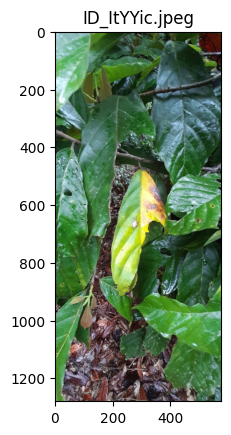

--------------------------------------



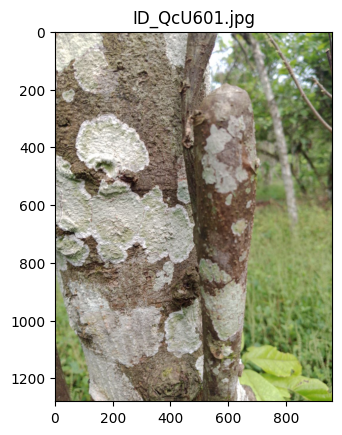

--------------------------------------



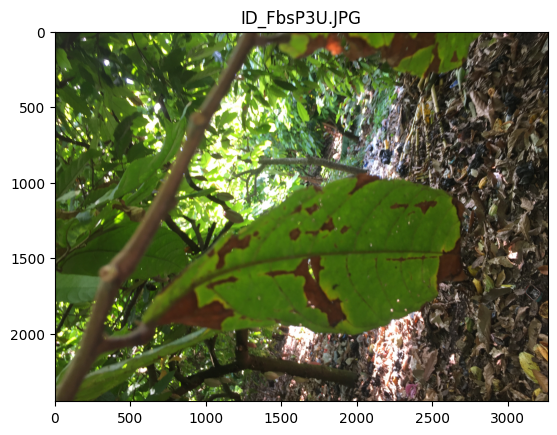

--------------------------------------



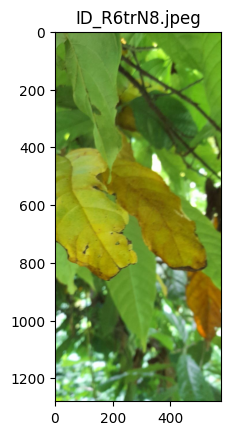

--------------------------------------



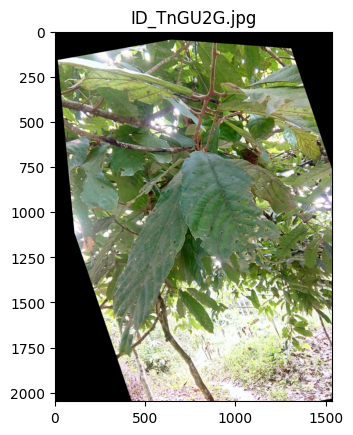

--------------------------------------



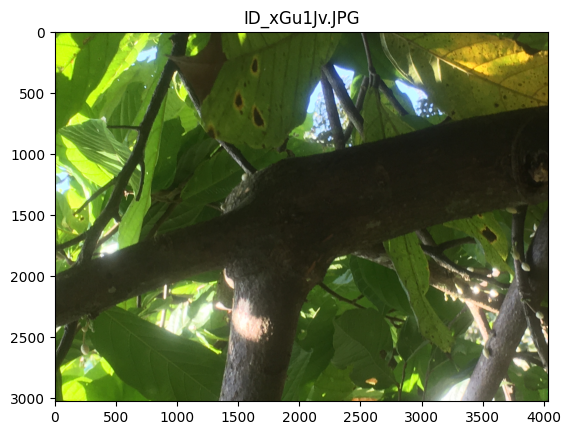

--------------------------------------



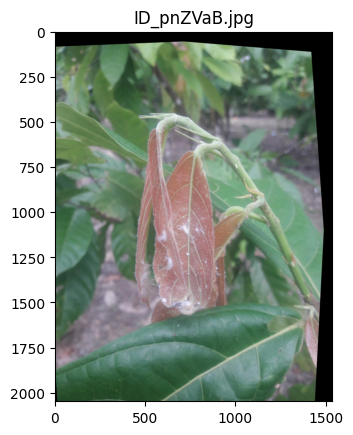

--------------------------------------



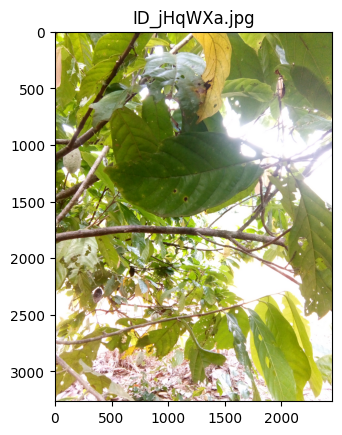

--------------------------------------



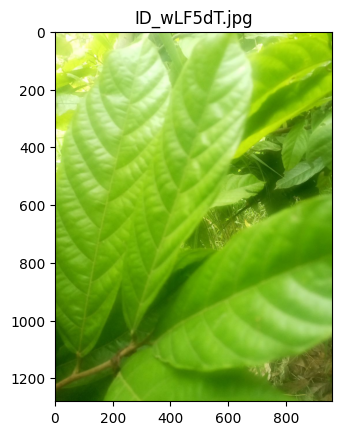

--------------------------------------



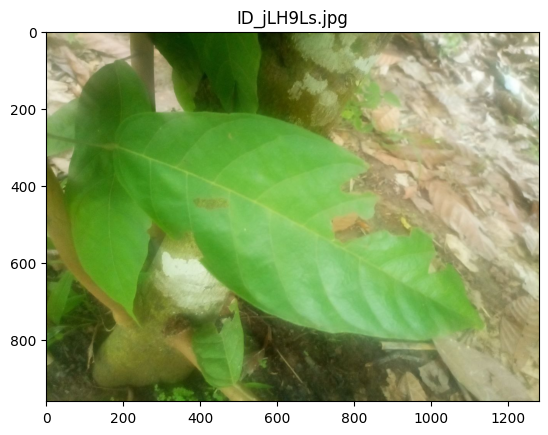

--------------------------------------



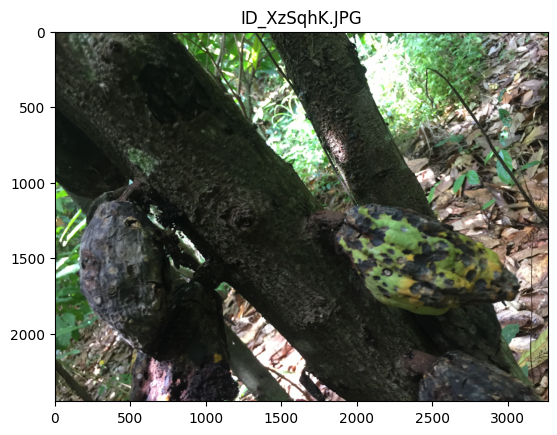

--------------------------------------



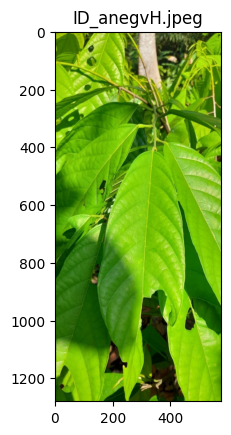

--------------------------------------



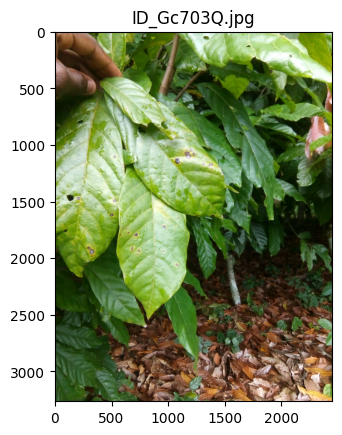

--------------------------------------



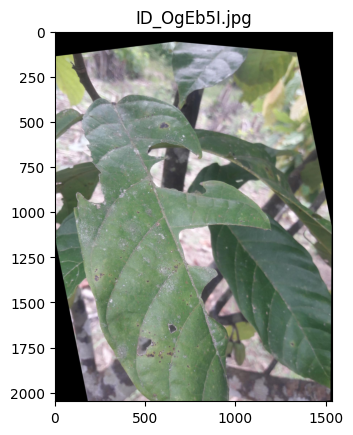

--------------------------------------



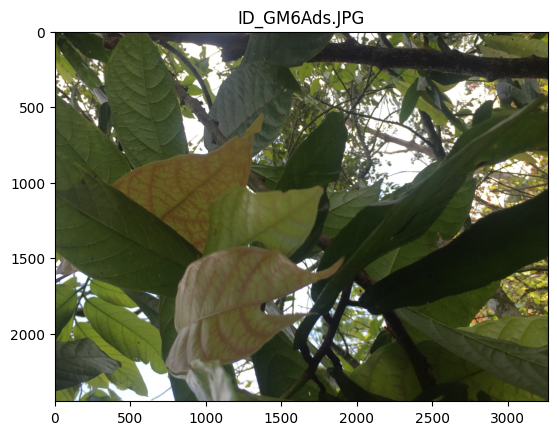

--------------------------------------



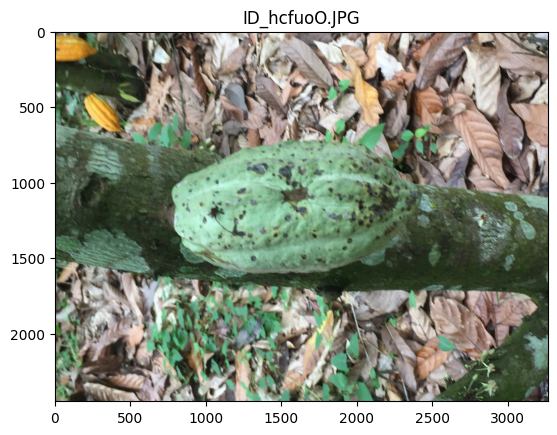

--------------------------------------



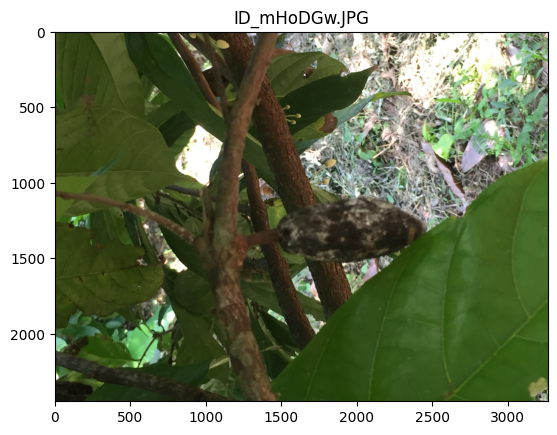

--------------------------------------



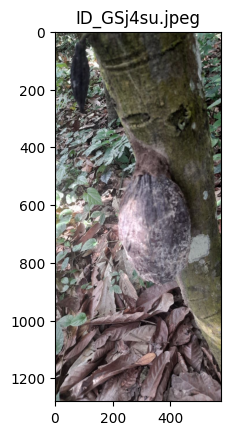

--------------------------------------



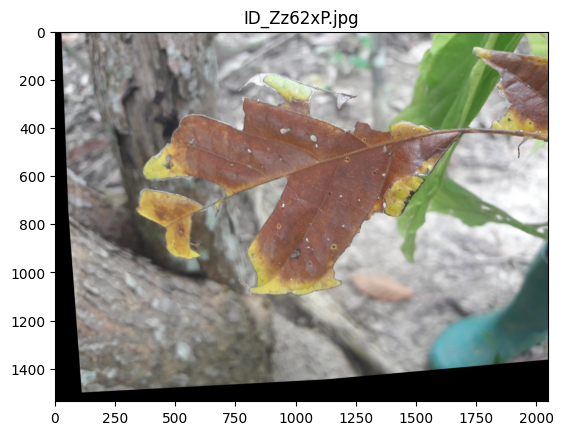

--------------------------------------



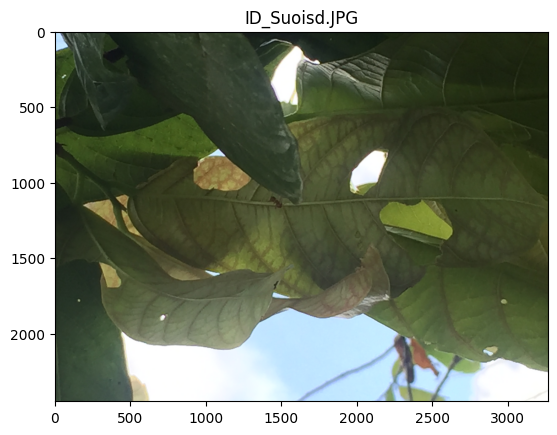

--------------------------------------



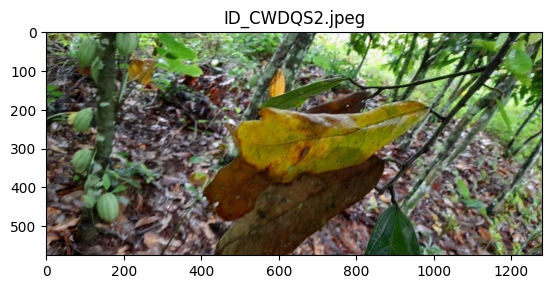

--------------------------------------



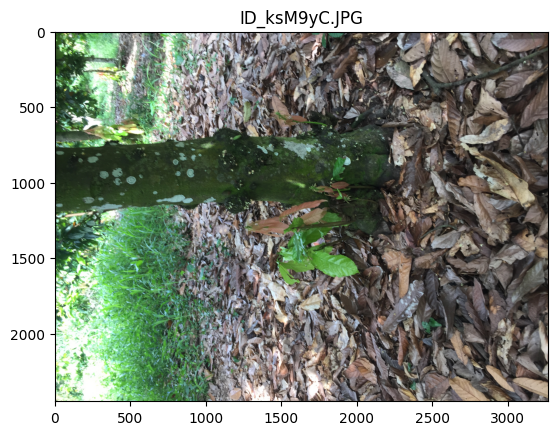

--------------------------------------



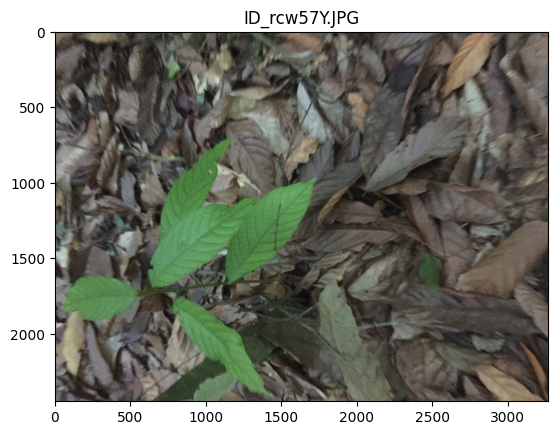

--------------------------------------



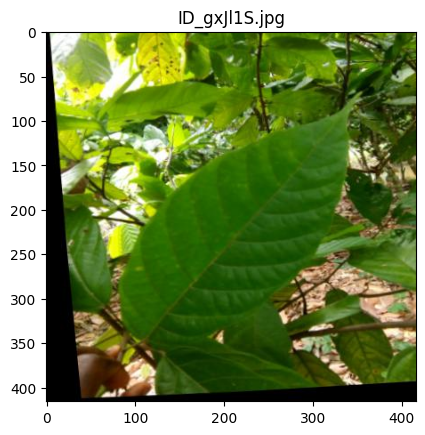

--------------------------------------



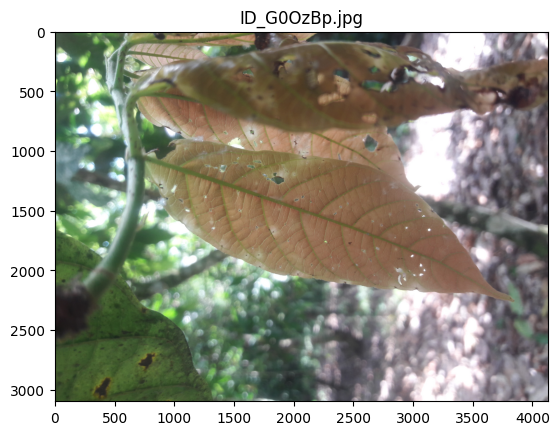

--------------------------------------



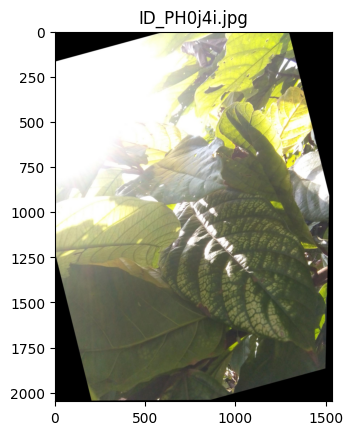

--------------------------------------



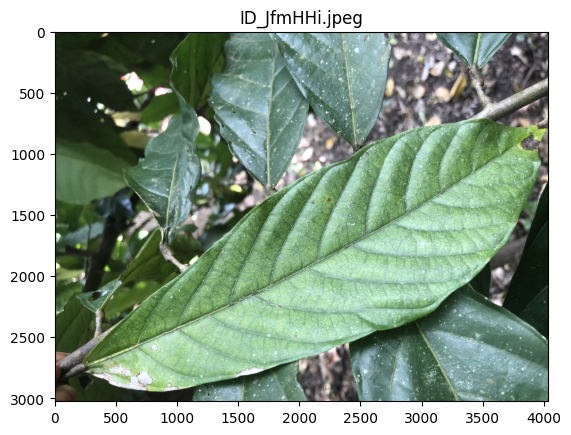

--------------------------------------



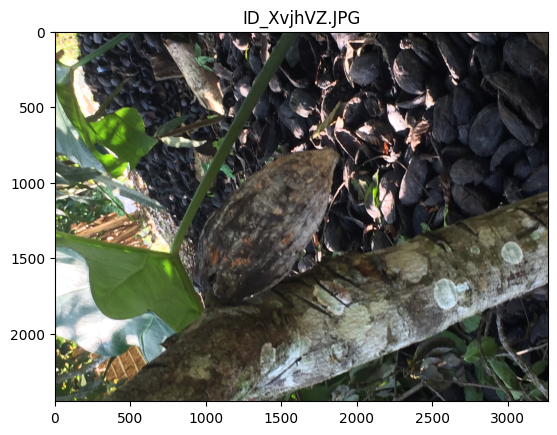

--------------------------------------



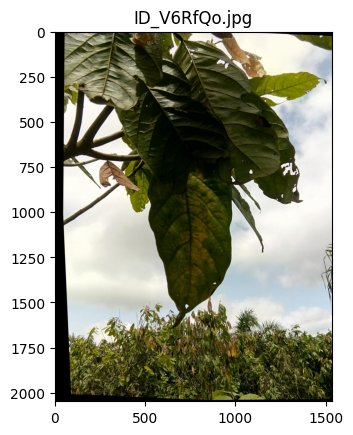

--------------------------------------



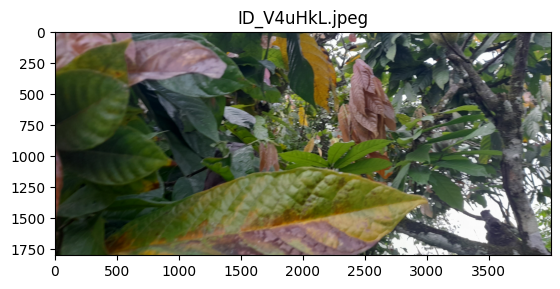

--------------------------------------



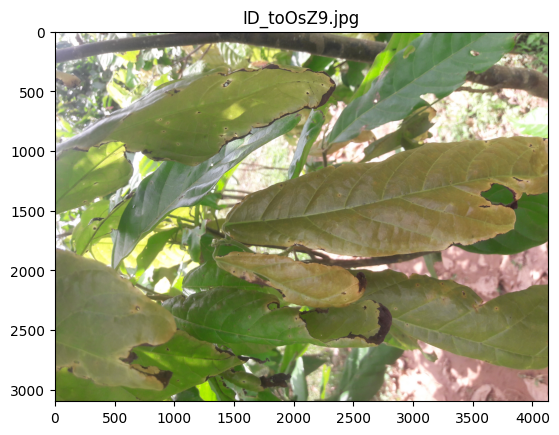

--------------------------------------



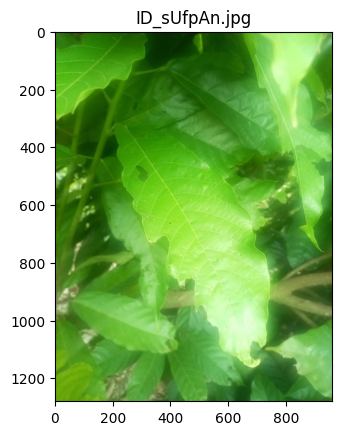

--------------------------------------



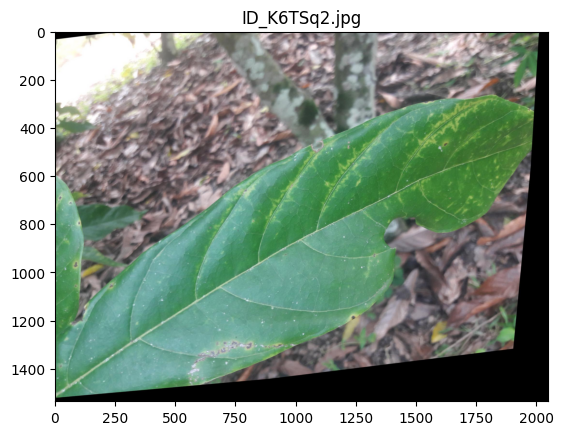

--------------------------------------



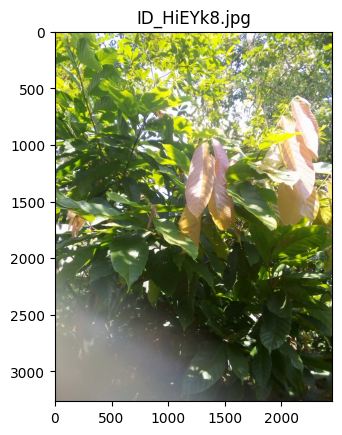

--------------------------------------



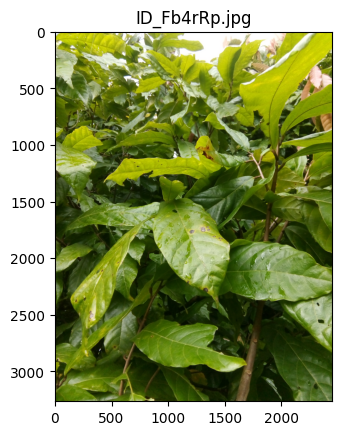

--------------------------------------



In [78]:
# Plot each of the image in no_detection dataframe
for image_name in no_detection['Image_ID'].unique():
    image_path = TEST_IMAGES_DIR / image_name
    plt.title(image_name)
    image = np.array(Image.open(str(image_path)))
    plt.imshow(image)
    plt.show()
    print('--------------------------------------\n')